# Crop image of ROI

## Main function

Function 1：For Visium, crop the region of interest (ROI) image and see cell type or gene expr.  \
    - Usually, the HE image of Visium (NPC) `< 1 GB`, in our test, nuclei-segmentation is worked. \
    - The input `roi_path` is unnecessary for run `StarDist_nuclei_segmente.py`. \
    - It can be set `segment=False` in `fst.crop_img_adata()` to avoide `.obsm['spatial']` ajustifation. \
Function 2：For Visium HD, crop ROI image with corresponding adata, save for nuclei-segmentation. \
    - Usually, the HE image of Visium HD (CRC) `> 10 GB`, nuclei-segmentation is limited by storage. \
    - Notice: the measured region for CRC dataset is much less than the given HE mage (~1/6). \
    - Set the selected region as `roi_path` to run `StarDist_nuclei_segmente.py`, see `ROI4_shape.csv` here. \
    - At this time, setting `segment=True` (default) in `fst.crop_img_adata()` to adjust `.obsm['spatial']`. \
    - When making nuclei-segmentation, `roi_path` is necessary for run `StarDist_nuclei_segmente.py`. \
    - Here, we also provide cropping the measured/whole image from one big HE image. 

In [2]:
import os
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# import FineST as fst
# from FineST.datasets import dataset
# import FineST.plottings as fstplt
# print("FineST version: %s" %fst.__version__)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
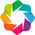

FineST version: 0.0.9


In [ ]:
path = '/mnt/lingyu/nfs_share2/Python/'
os.chdir(str(path) + 'FineST/FineST/')
import FineST as fst
from FineST.datasets import dataset
import FineST.plottings as fstplt
print("FineST version: %s" %fst.__version__)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
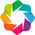

FineST version: 0.0.9


In [ ]:
# import importlib
# import sys
# sys.path.append(str(path)+'FineST/FineST/')
# import FineST as fst
# import FineST.plottings
# importlib.reload(FineST.plottings )
# from FineST.plottings  import *
# print("FineST version: %s" %fst.__version__)

## 1. Crop ROI image from NPC Visium dataset

**1.1 Crop image with adata**

The 10x Visium dataset (NPC_patient_1) from [Gong, et al](https://www.nature.com/articles/s41467-023-37614-6) can be downloaded from NPC1 in [Goole Drive](https://drive.google.com/drive/folders/1XQiRCyZv_xFrjjHMc3TrQ-R_srSwnGLE?dmr=1&ec=wgc-drive-globalnav-goto), where `ROI1.csv` is another ROI in paper.

**Input** \
    - `roi_path`: the pathway of the selected region using `napari` package. \
    - `img_path`: the original `.tif` HE image with high-resolution, it is about `800 MB` here. \
    - `adata_path`: the `.h5ad` adata corresponding to the HE image, from 10x Visium dataset. 
    
**Output** \
    - `crop_img_path`: the cropped image, saved in `.tif` format. \
    - `crop_adata_path`: the saved ST data, selected the `.obsm['spatial']` matched cropped image.

In [5]:
os.chdir(str(path))
roi_path = './FineST/FineST_local/Dataset/NPC/CropROI/Annodata/ROI1_TLS.csv'
img_path = './NPC/Data/stdata/GSE200310_RAW/patient1/20210809-C-AH4199551.tif'
adata_path = './FineST/FineST_local/Dataset/NPC/TransImp/patient1_nuclei_anno_TransImp_NPC1_sc.h5ad'
crop_img_path = './FineST/FineST_local/Dataset/NPC/CropROI/NPC1_cropped_ROI_image.tif'
crop_adata_path = './FineST/FineST_local/Dataset/NPC/CropROI/NPC1_sc_ROI.h5ad'

In [6]:
cropped_img, adata_roi = fst.crop_img_adata(roi_path, 
                                            img_path, adata_path, 
                                            crop_img_path, crop_adata_path, 
                                            segment=False, save=True)

ROI coordinates from napari package: 
    index shape-type  vertex-index        axis-0       axis-1
0      3    polygon             0   9233.387767  5426.173165
1      3    polygon             1   9233.387767  6922.797893
2      3    polygon             2  10150.000000  6922.797893
3      3    polygon             3  10150.000000  5426.173165
img shape: 
 (17351, 17319, 3)
polygon: 
 [[ 9233.387767  5426.173165]
 [ 9233.387767  6922.797893]
 [10150.        6922.797893]
 [10150.        5426.173165]]
polygon adjusted: 
 [[ 9233.387767  5426.173165]
 [ 9233.387767  6922.797893]
 [10150.        6922.797893]
 [10150.        5426.173165]]
cropped_img shape: 
 (917, 1496, 3)
The adata: 
 AnnData object with n_obs × n_vars = 40068 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
The range of original adata: 
 [[1791, 13306], [1357, 11398]]


Show image shape and adata property

In [7]:
print(cropped_img.shape)
print(adata_roi)

(917, 1496, 3)
AnnData object with n_obs × n_vars = 869 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


See the range of the spatial coordinats of the 1st colnum and 2nd colnum in `adata.obsm['spatial']`

In [8]:
print(adata_roi.obsm["spatial"][:,0].min(), adata_roi.obsm["spatial"][:,0].max())
print(adata_roi.obsm["spatial"][:,1].min(), adata_roi.obsm["spatial"][:,1].max())

5547 6921
9234 10149


Plot the crooped ROI region in original HE image with high-resolution

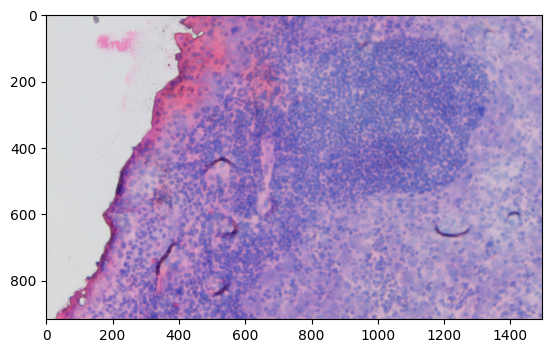

In [9]:
plt.imshow(cropped_img)
plt.show()

See the gene expression saved in `adata.X`, only contains the samples that belongs to the cropped ROI image

In [10]:
adata_roi.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,KDR,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR
6447,0.198093,0.097630,0.198527,0.003750,0.152948,0.097517,0.003173,0.004177,0.003968,0.132939,...,0.004140,0.004109,0.004189,0.004627,0.004840,0.074180,0.004038,0.069006,0.462114,0.589054
6455,0.334080,0.441975,0.119213,0.004921,0.119349,0.028712,0.003824,0.048485,0.004010,0.149004,...,0.021774,0.066070,0.004470,0.071718,0.059498,0.017121,0.004436,0.205508,0.440389,1.044084
6565,0.451144,0.128095,0.081239,0.004624,0.377256,0.071486,0.004701,0.012491,0.004921,0.077157,...,0.063230,0.004575,0.004751,0.014711,0.081885,0.059292,0.004636,0.144947,0.282062,0.860366
6606,0.202606,0.170748,0.219795,0.004157,0.084789,0.053321,0.002863,0.004264,0.004208,0.162051,...,0.003749,0.003521,0.004434,0.004202,0.004913,0.003386,0.003636,0.115993,0.592637,0.791180
6628,0.451679,0.128360,0.097917,0.004488,0.364679,0.099784,0.004456,0.027165,0.033183,0.118700,...,0.004788,0.004697,0.010375,0.004548,0.111223,0.056878,0.004427,0.122713,0.414587,0.874933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17926,0.703735,0.155722,0.054981,0.082285,0.075187,0.339756,0.002853,0.103673,0.003895,0.168941,...,0.004126,0.011032,0.004477,0.055611,0.276188,0.133410,0.134314,0.673328,0.720801,0.772462
17928,0.660003,0.204267,0.056055,0.004687,0.103312,0.282786,0.008591,0.154334,0.003907,0.055584,...,0.055088,0.023433,0.025247,0.046613,0.277214,0.187400,0.187673,1.119787,0.798056,0.844024
17929,0.294317,0.169527,0.067037,0.064530,0.026901,0.416031,0.002459,0.092877,0.004721,0.123815,...,0.004063,0.038419,0.048832,0.003885,0.164652,0.346541,0.346903,1.783141,0.899748,0.836969
17936,0.981570,0.781067,0.356109,0.354484,0.447250,0.898237,0.003626,0.397402,0.055774,0.461117,...,0.056405,0.004630,0.004537,0.356769,0.220263,0.003947,0.044389,0.052299,0.802892,1.417577


The NPC1 adata `visium_nuclei_annotated_TransImp_NPC1.h5ad` is obtained from nuclei-segmentaion and cell type annotation, so we can show the cells within this ROI. For others ones can only show the gene expression situation.

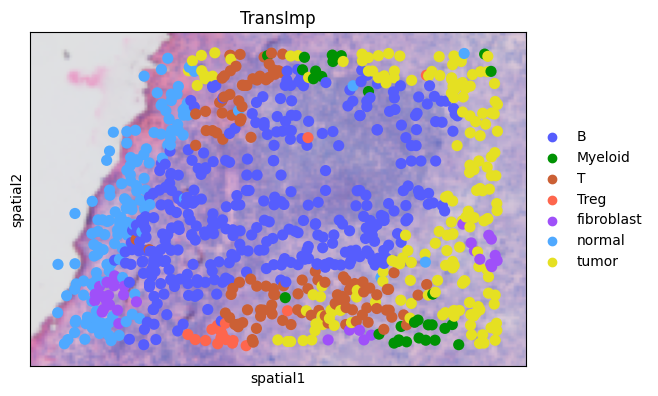

In [12]:
import matplotlib.pyplot as plt
ctype_hex_map = {'B': '#565DFD',
 'normal': '#4fa9ff',
 'Treg': '#FE664D',
 'fibroblast': '#9f50f9',
 'Myeloid': '#009203',
 'tumor': '#e5e022',
 'T': '#CB6035'}

fig, ax = plt.subplots(1, 1, dpi=100)
sc.pl.spatial(adata_roi, img_key='hires', color="cell_type", title='TransImp', 
              size=0.25, alpha_img=0.8, palette=ctype_hex_map, ax=ax)  

In [13]:
os.chdir(f"{path}/FineST/FineST_local/Dataset/NPC/CropROI/")
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/NPC/CropROI


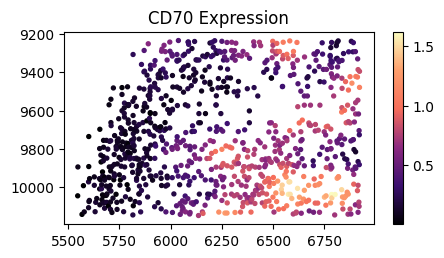

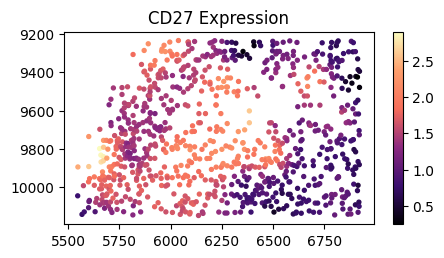

In [16]:
fstplt.gene_expr(adata_roi, adata_roi.to_df(), gene_selet='CD70', marker='o', 
                 s=8, figsize=(5, 2.5), save_path='CD70_expr_ROI1.pdf')
fstplt.gene_expr(adata_roi, adata_roi.to_df(), gene_selet='CD27', marker='o',
                 s=8, figsize=(5, 2.5), save_path='CD27_expr_ROI1.pdf')

**1.2 CCC analysis within the cropped ROI**

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
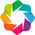

SpatailDM version: 0.2.0


In [17]:
import spatialdm as sdm
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

In [18]:
adata_impt_sc = adata_roi

In [19]:
visium_scale_factors = fst.json_load(f"{path}/FineST/FineST_local/Dataset/NPC/patient1/")
print(visium_scale_factors['spot_diameter_fullres'])

139.44595843130838


In [20]:
# spot_diameter_fullres = visium_scale_factors["spot_diameter_fullres"]
spot_diameter_fullres = 112
fst.weight_matrix(adata_impt_sc, l = spot_diameter_fullres, 
                  cutoff = 0.001, single_cell = True, n_nearest_neighbors=6)

AnnData object with n_obs × n_vars = 869 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'

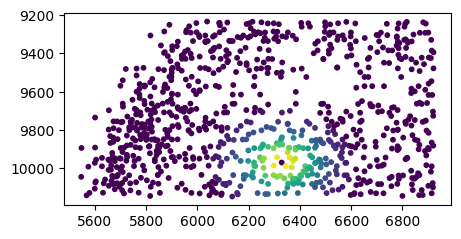

In [21]:
## Visualize the range of interaction
plt.figure(figsize=(5, 2.5))
plt.scatter(adata_impt_sc.obsm['spatial'][:,0], adata_impt_sc.obsm['spatial'][:,1],
            c=adata_impt_sc.obsp['weight'].A[500], s=10.0)
plt.gca().invert_yaxis()  
plt.tick_params(axis='both', which='both', bottom=True, left=True, labelbottom=True)

In [22]:
## find overlapping LRs from CellChatDB
start = time.time()
sdm.extract_lr(adata_impt_sc, 'human', min_cell=3)    
print("%.3f seconds" %(time.time()-start))
print(adata_impt_sc)

11.320 seconds
AnnData object with n_obs × n_vars = 869 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell', 'mean', 'ligand', 'receptor', 'num_pairs', 'geneInter'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'


In [23]:
## see the condidiate LR pairs for this NPC datset 
adata_impt_sc.uns['geneInter']

,interaction_name,pathway_name,agonist,antagonist,co_A_receptor,co_I_receptor,evidence,annotation,interaction_name_2
EFNA5_EPHB2,EFNA5_EPHB2,EPHA,NaN,NaN,NaN,NaN,PMID:15107857; PMID: 15114347,Cell-Cell Contact,EFNA5 - EPHB2
EFNB1_EPHA4,EFNB1_EPHA4,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHA4
EFNB1_EPHB1,EFNB1_EPHB1,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHB1
EFNB1_EPHB2,EFNB1_EPHB2,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHB2
EFNB1_EPHB3,EFNB1_EPHB3,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHB3
...,...,...,...,...,...,...,...,...,...
CCL3_CCR5,CCL3_CCR5,CCL,NaN,NaN,NaN,NaN,KEGG: hsa04060,Secreted Signaling,CCL3 - CCR5
CCL5_CCR5,CCL5_CCR5,CCL,NaN,NaN,NaN,NaN,KEGG: hsa04060,Secreted Signaling,CCL5 - CCR5
CCL4_CCR5,CCL4_CCR5,CCL,NaN,NaN,NaN,NaN,KEGG: hsa04060,Secreted Signaling,CCL4 - CCR5
CXCL1_ACKR1,CXCL1_ACKR1,CXCL,NaN,NaN,NaN,NaN,PMID: 26740381,Secreted Signaling,CXCL1 - ACKR1


In [24]:
## Identify dataset-specific interacting LR pairs (global selection)
start = time.time()

# global Moran selection
sdm.spatialdm_global(adata_impt_sc, n_perm=1000, specified_ind=None, method='z-score', nproc=1)  

# select significant pairs
sdm.sig_pairs(adata_impt_sc, method='z-score', fdr=True, threshold=0.05)  

print("%.3f seconds" %(time.time()-start))
print(adata_impt_sc)

2.895 seconds
AnnData object with n_obs × n_vars = 869 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell', 'mean', 'ligand', 'receptor', 'num_pairs', 'geneInter', 'global_I', 'global_stat', 'global_res'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'


In [25]:
spa_coexp_pair_sc = fst.anno_LRpair(adata_impt_sc)
spa_coexp_pair_sc

,Ligand0,Ligand1,Receptor0,Receptor1,Receptor2,z_pval,z,fdr,selected,evidence,annotation
SEMA3B_NRP1_PLXNA1,SEMA3B,None,NRP1,PLXNA1,None,0.000000,58.350883,0.0,True,PMID: 27533782,Secreted Signaling
WNT5B_FZD3,WNT5B,None,FZD3,None,None,0.000000,58.902293,0.0,True,KEGG: hsa04310,Secreted Signaling
WNT5B_FZD2,WNT5B,None,FZD2,None,None,0.000000,117.182087,0.0,True,KEGG: hsa04310,Secreted Signaling
WNT5A_FZD1,WNT5A,None,FZD1,None,None,0.000000,79.102866,0.0,True,KEGG: hsa04310,Secreted Signaling
WNT4_FZD6_LRP6,WNT4,None,FZD6,LRP6,None,0.000000,100.444906,0.0,True,KEGG: hsa04310; PMID: 23209147,Secreted Signaling
...,...,...,...,...,...,...,...,...,...,...,...
TGFB3_ACVR1C_TGFBR2,TGFB3,None,ACVR1C,TGFBR2,None,1.000000,-21.368593,1.0,False,PMID: 27449815,Secreted Signaling
SEMA3G_NRP2_PLXNA3,SEMA3G,None,NRP2,PLXNA3,None,1.000000,-12.182868,1.0,False,PMID: 27533782,Secreted Signaling
TGFB2_ACVR1_TGFBR1,TGFB2,None,ACVR1,TGFBR1,TGFBR2,0.704050,-0.536083,1.0,False,PMID: 29376829,Secreted Signaling
SEMA3A_NRP1_PLXNA1,SEMA3A,None,NRP1,PLXNA1,None,1.000000,-80.378268,1.0,False,PMID: 27533782,Secreted Signaling


In [26]:
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/NPC/CropROI


In [27]:
## see the unique gene of sig LR pairs
spa_coexp_pairTgene_sc = fst.LRpair_gene(spa_coexp_pair_sc)
print("spa_coexp_pairTgene_sc shape:", len(spa_coexp_pairTgene_sc))

spa_coexp_pairTgene_sc shape: 392


In [28]:
## save 798 significant LR pairs
# spa_coexp_pair_sc.to_csv("spa_coexp_pair_sc_ROI_singleT.csv", index=True, header=True)
# spa_coexp_pairTgene_sc.to_csv("spa_coexp_LRgene_sc_ROI_singleT.csv", index=True, header=True)

In [29]:
## use fdr corrected global p-values and a threshold FDR < 0.1 (default)
print(adata_impt_sc.uns['global_res'].selected.sum())
adata_impt_sc.uns['global_res'].sort_values(by='fdr')  

633


,Ligand0,Ligand1,Receptor0,Receptor1,Receptor2,z_pval,z,fdr,selected
SEMA3B_NRP1_PLXNA1,SEMA3B,None,NRP1,PLXNA1,None,0.000000,58.350883,0.0,True
WNT5B_FZD3,WNT5B,None,FZD3,None,None,0.000000,58.902293,0.0,True
WNT5B_FZD2,WNT5B,None,FZD2,None,None,0.000000,117.182087,0.0,True
WNT5A_FZD1,WNT5A,None,FZD1,None,None,0.000000,79.102866,0.0,True
WNT4_FZD6_LRP6,WNT4,None,FZD6,LRP6,None,0.000000,100.444906,0.0,True
...,...,...,...,...,...,...,...,...,...
TGFB3_ACVR1C_TGFBR2,TGFB3,None,ACVR1C,TGFBR2,None,1.000000,-21.368593,1.0,False
SEMA3G_NRP2_PLXNA3,SEMA3G,None,NRP2,PLXNA3,None,1.000000,-12.182868,1.0,False
TGFB2_ACVR1_TGFBR1,TGFB2,None,ACVR1,TGFBR1,TGFBR2,0.704050,-0.536083,1.0,False
SEMA3A_NRP1_PLXNA1,SEMA3A,None,NRP1,PLXNA1,None,1.000000,-80.378268,1.0,False


In [30]:
## Local selection is then run for the selected 787 pairs to identify where the LRI takes place
adata_impt_sc.raw = adata_impt_sc

start = time.time()

# local spot selection
sdm.spatialdm_local(adata_impt_sc, n_perm=1000, method='z-score', specified_ind=None, nproc=1) 

# significant local spots
sdm.sig_spots(adata_impt_sc, method='z-score', fdr=False, threshold=0.05)  

print("%.3f seconds" %(time.time()-start))

print(adata_impt_sc)

2.012 seconds
AnnData object with n_obs × n_vars = 869 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell', 'mean', 'ligand', 'receptor', 'num_pairs', 'geneInter', 'global_I', 'global_stat', 'global_res', 'local_stat', 'local_z', 'local_z_p', 'selected_spots'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'


In [31]:
adata_impt_sc.uns["local_z_p"]

,6447,6455,6565,6606,6628,6742,6745,6750,6751,6756,...,17866,17867,17896,17918,17921,17926,17928,17929,17936,17937
EFNA5_EPHB2,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,...,1.000000,0.999999,0.680734,7.843035e-01,7.611461e-01,1.000000,0.358194,0.589553,0.999999,1.000000
EFNB1_EPHA4,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,...,1.000000,1.000000,1.000000,9.998118e-01,9.999623e-01,1.000000,1.000000,1.000000,1.000000,1.000000
EFNB1_EPHB2,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,...,1.000000,1.000000,0.782109,3.991351e-04,5.161432e-06,1.000000,1.000000,1.000000,1.000000,1.000000
EFNB1_EPHB3,1.000000,0.999975,1.000000,0.860773,1.000000,1.000000,0.862382,1.0,1.0,1.000000,...,0.794550,0.998119,0.998188,3.091866e-07,1.703935e-09,0.976528,0.967216,0.352597,0.999810,0.999999
EFNB1_EPHB4,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.474585,1.0,1.0,1.000000,...,0.594133,0.954794,0.978483,8.458961e-01,9.556086e-01,0.815551,0.738425,0.474521,0.974414,0.992965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCL20_CCR6,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,...,0.973242,0.560701,1.000000,1.000000e+00,1.000000e+00,0.783516,1.000000,0.980221,0.532373,0.855033
CCL3_CCR5,0.722064,1.000000,0.999726,1.000000,0.999105,0.998531,1.000000,1.0,1.0,0.997533,...,1.000000,0.877487,1.000000,4.094817e-05,3.691173e-02,1.000000,1.000000,1.000000,0.375085,1.000000
CCL5_CCR5,0.849123,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,...,1.000000,1.000000,1.000000,1.848242e-09,6.749696e-17,1.000000,1.000000,1.000000,1.000000,1.000000
CCL4_CCR5,0.505591,1.000000,0.838770,1.000000,0.684509,0.330065,1.000000,1.0,1.0,0.236554,...,0.869476,0.562464,1.000000,9.809579e-02,9.248781e-05,1.000000,0.999896,0.787115,0.501884,0.989836


In [32]:
fst.topLRpairs(adata_impt_sc, spa_coexp_pair_sc, num=10)

['CDH1_CDH1',
 'JAM3_JAM3',
 'CADM1_CADM1',
 'F11R_F11R',
 'JAM2_JAM2',
 'ESAM_ESAM',
 'PECAM1_PECAM1',
 'MPZL1_MPZL1',
 'CD99_CD99',
 'CDH2_CDH2']

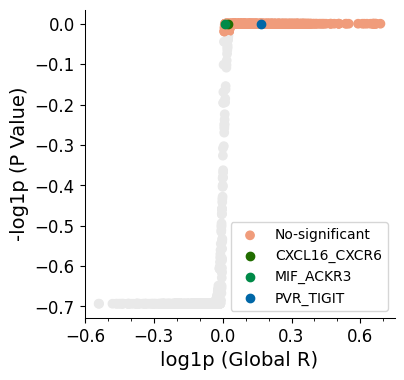

In [34]:
fstplt.global_plot(adata_impt_sc, pairs=['CXCL16_CXCR6', "MIF_ACKR3", 'PVR_TIGIT'],
               figsize=(4.0, 4.0), loc=4, cmap='RdGy_r', vmin=-1.5, vmax=2,  max_step=0.3, min_step=0.1)
plt.savefig('NPC1_3pair_sc_ROI1_singleT.svg', transparent=True, dpi=300, bbox_inches='tight')

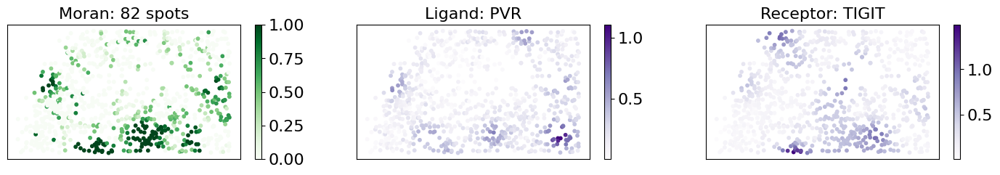

In [35]:
fstplt.plot_pairs_dot(adata_impt_sc, ['PVR_TIGIT'], trans=True, figsize=(30,2.4), 
                      marker_size=10)

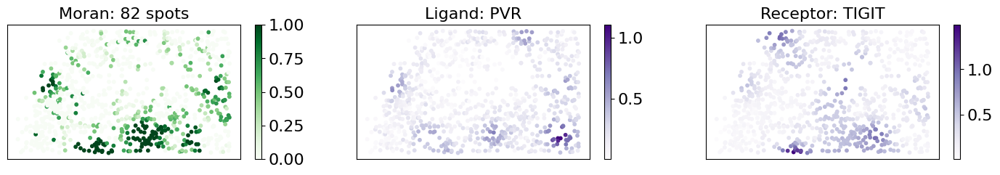

In [36]:
fstplt.plot_pairs_dot(adata_impt_sc, ['PVR_TIGIT'], trans=True, figsize=(30,2.4), 
                      marker_size=10, pdf="NPC1_sc_pair_ROI1_PVR_TIGIT")

In [37]:
# bin_spots = (1-adata_impt_sc.uns["local_z_p"])[adata_impt_sc.uns['local_stat']['n_spots']>2]
bin_spots = adata_impt_sc.uns['selected_spots'].astype(int)[adata_impt_sc.uns['local_stat']['n_spots']>2]
print(bin_spots.shape[0], " pairs used for spatial clustering")
bin_spots=bin_spots.fillna(0)
bin_spots

633  pairs used for spatial clustering


,6447,6455,6565,6606,6628,6742,6745,6750,6751,6756,...,17866,17867,17896,17918,17921,17926,17928,17929,17936,17937
EFNA5_EPHB2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EFNB1_EPHA4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EFNB1_EPHB2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
EFNB1_EPHB3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
EFNB1_EPHB4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCL20_CCR6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CCL3_CCR5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
CCL5_CCR5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
CCL4_CCR5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [44]:
from threadpoolctl import threadpool_limits
import NaiveDE
import SpatialDE

with threadpool_limits(limits=1, user_api='blas'):
    start = time.time()
    results = SpatialDE.run(adata_impt_sc.obsm['spatial'], bin_spots.transpose())
    print("--- %.3f seconds ---" %(time.time()-start))

    start = time.time()
    histology_results, patterns = SpatialDE.aeh.spatial_patterns(
        adata_impt_sc.obsm['spatial'], bin_spots.transpose(), results, C=3, l=3, verbosity=1)
    print("--- %.3f seconds ---" %(time.time()-start))

INFO:root:Performing DE test
INFO:root:Pre-calculating USU^T = K's ...
INFO:root:Done: 1.2s
INFO:root:Fitting gene models
Models: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:11<00:00,  1.12s/it]
INFO:root:Finished fitting 10 models to 633 genes


--- 12.735 seconds ---
iter 0, ELBO: -1.84e+08
iter 1, ELBO: -1.51e+08, delta_ELBO: 3.29e+07
iter 2, ELBO: -1.51e+08, delta_ELBO: 8.31e+04
iter 3, ELBO: -1.51e+08, delta_ELBO: 9.37e+03
iter 4, ELBO: -1.51e+08, delta_ELBO: 2.11e+03
iter 5, ELBO: -1.51e+08, delta_ELBO: 1.68e+03
iter 6, ELBO: -1.51e+08, delta_ELBO: 2.29e+02
iter 7, ELBO: -1.51e+08, delta_ELBO: 1.75e+03
iter 8, ELBO: -1.51e+08, delta_ELBO: 8.58e+02
iter 9, ELBO: -1.51e+08, delta_ELBO: 3.24e+02
iter 10, ELBO: -1.51e+08, delta_ELBO: 6.63e+01
iter 11, ELBO: -1.51e+08, delta_ELBO: 2.35e+02
iter 12, ELBO: -1.51e+08, delta_ELBO: 1.75e+02
iter 13, ELBO: -1.51e+08, delta_ELBO: 9.05e+01
iter 14, ELBO: -1.51e+08, delta_ELBO: 2.06e+01
iter 15, ELBO: -1.51e+08, delta_ELBO: 2.72e-01
iter 16, ELBO: -1.51e+08, delta_ELBO: 8.06e+00
iter 17, ELBO: -1.51e+08, delta_ELBO: 3.23e+00
iter 18, ELBO: -1.51e+08, delta_ELBO: 1.46e+01
iter 19, ELBO: -1.51e+08, delta_ELBO: 1.76e+01
iter 20, ELBO: -1.51e+08, delta_ELBO: 5.17e+01
iter 21, ELBO: -1.51e+

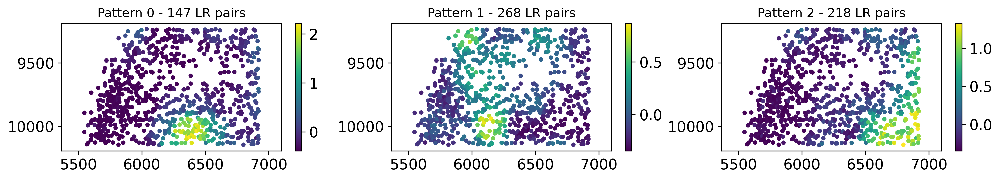

In [52]:
fst.spatialDE_clusters(histology_results, patterns, adata_impt_sc.obsm['spatial'], w=3, s=10, 
                       figsize=(16,2.2), trans=True, format='svg', marker='o',
                       save_path='NPC1_mel_DE_clusters_singleT.svg')

In [54]:
histology_results.to_csv('NPC1_histology_results_sc_ROI1.csv', index=False)
patterns.to_csv('NPC1_patterns_sc_ROI1.csv', index=False)

**1.3 L-R-TF-TG analysis**

In [7]:
import os
import pandas as pd
os.chdir(str(path)+'FineST/FineST_local/Dataset/NPC/CropROI/')
histology_results = pd.read_csv('NPC1_histology_results_sc_ROI1.csv')

In [8]:
histology_results

,g,pattern,membership
0,FGF7_FGFR1,1,1.0
1,CDH4_CDH4,1,1.0
2,EFNA1_EPHA3,2,1.0
3,CLDN11_CLDN11,1,1.0
4,CD274_PDCD1,1,1.0
...,...,...,...
628,CCL8_ACKR4,1,1.0
629,CCL21_ACKR4,1,1.0
630,BMP4_BMPR1B_ACVR2A,1,1.0
631,BMP4_BMPR1A_ACVR2A,1,1.0


In [18]:
path = '/mnt/lingyu/nfs_share2/Python/'
os.chdir(str(path) + 'FineST/FineST/')

In [19]:
Receptor2TF = fst.extract_tf(species='human')
Receptor2TF

,receptor,pathway,tf,tf_PPR,category
0,PKM,Glycolysis / Gluconeogenesis,ENO1,0.042934,Metabolism
1,ALDOA,Glycolysis / Gluconeogenesis,ENO1,0.009696,Metabolism
2,GPI,Glycolysis / Gluconeogenesis,ENO1,0.000961,Metabolism
3,MINPP1,Glycolysis / Gluconeogenesis,ENO1,0.066090,Metabolism
4,NPR2,Purine metabolism,NME2,0.022436,Metabolism
...,...,...,...,...,...
93601,"PLXNA1,TREM2,TYROBP",Nervous system development,PSMD9,0.000153,Developmental Biology
93602,"PLXNA1,TREM2,TYROBP",Nervous system development,SOS1,0.002213,Developmental Biology
93603,"PLXNA1,TREM2,TYROBP",Nervous system development,SOS2,0.000206,Developmental Biology
93604,"PLXNA1,TREM2,TYROBP",Nervous system development,SRC,0.009406,Developmental Biology


In [20]:
RegNetwork = pd.read_csv(str(path)+'FineST/FineST/FineST/datasets/RegNetwork/Regnetwork_hum.csv')
RegNetwork.columns = ['tf', 'target']
RegNetwork

,tf,target
0,ZBTB33,WASH8P
1,ZBTB33,CHAF1A
2,ZBTB33,MTRNR2L1
3,ZBTB33,MTRNR2L2
4,ZBTB33,MTRNR2L8
...,...,...
192067,ZNF76,CDKN1A
192068,ZNF76,PCYT1A
192069,ZNF76,TALDO1
192070,ZNRD1,ABCB1


In [37]:
tmp = fst.pattern_LR2TF2TG(histology_results, pattern_num=2, R_TFdatabase=Receptor2TF, TF_TGdatabase=RegNetwork)
tmp

This pattern contain %s unique ligand 89
This pattern contain %s unique receptor 94
This pattern contain %s unique tf 307


,Ligand,Receptor,tf,Target,value
0,CD80,CD274,BATF,MSC-AS1,0.020307
1,EBI3,IL6ST,BATF,MSC-AS1,0.000288
2,HBEGF,EGFR,BATF,MSC-AS1,0.007423
4,IL11,IL11RA,BATF,MSC-AS1,0.000356
5,IL11,IL6ST,BATF,MSC-AS1,0.000288
...,...,...,...,...,...
15226945,VTN,ITGB3,ZNF383,JUN,0.010592
15226946,TNC,ITGB3,ZNF383,JUN,0.010592
15226947,SPP1,ITGA5,ZNF383,JUN,0.010592
15226948,IGF1,ITGB3,ZNF383,JUN,0.010592


In [38]:
## order according to 'value'
tmp = tmp.sort_values(by="value", ascending=False)
## statistic value classes
num_classes = tmp['value'].nunique()
print('Number of unique classes: ', num_classes)

selected_rows = []
num_sele = 1
for value, group in tmp.groupby('value'):
    selected_rows.append(group.head(num_sele))
    
tmp_sele = pd.concat(selected_rows)
tmp_sele = tmp_sele.sort_values(by="value", ascending=False)
print('Length of tmp_sele:\n', len(tmp_sele))
print(tmp_sele)

Number of unique classes:  1398
Length of tmp_sele:
 1398
          Ligand Receptor      tf Target     value
11991626   TGFB2   TGFBR2   SMAD3   BTRC  0.459459
12018766   TGFB2   TGFBR2   SMAD3  PCDH1  0.459459
11977187   TGFB2   TGFBR2   SMAD4   TFE3  0.390541
11971408   TGFB2   TGFBR2   SMAD4  RPL28  0.390541
14434846  LRRC4B    PTPRF  CTNNB1  PTPRU  0.285677
...          ...      ...     ...    ...       ...
14787206   LAMB1    ITGB1    ABL1   CSF1  0.000002
14766249   WNT3A     FZD2  RUVBL1    PLG  0.000002
15225500   CNTN2    L1CAM    UPF2   UPF1  0.000001
15225504  COL9A2    ITGA9    UPF2   UPF1  0.000001
15225509  COL1A2    ITGB1    UPF2   UPF1  0.000001

[1398 rows x 5 columns]


In [39]:
num_top = 20
tmp_sele_top = tmp_sele[:num_top]
tmp_sele_top

,Ligand,Receptor,tf,Target,value
11991626,TGFB2,TGFBR2,SMAD3,BTRC,0.459459
12018766,TGFB2,TGFBR2,SMAD3,PCDH1,0.459459
11977187,TGFB2,TGFBR2,SMAD4,TFE3,0.390541
11971408,TGFB2,TGFBR2,SMAD4,RPL28,0.390541
14434846,LRRC4B,PTPRF,CTNNB1,PTPRU,0.285677
15085114,JAG2,NOTCH3,RBPJ,NFKB1,0.283606
10525370,IL11,IL6ST,STAT3,HLA-DRB1,0.228232
13441976,BMP8A,ACVR2B,SMAD2,OS9,0.221048
11974051,GDF7,ACVR2A,SMAD4,SMAD9,0.214991
12032964,TGFB2,TGFBR2,SMAD3,TGFBR1,0.183767


In [40]:
## select some inmortant ligands and receptors
ligand_list = {'MIF', 'CXCL16', 'PVR',  'EFNA5', 'ICAM2', 'JAM3', 'EFNA5', 'L1CAM', 'JAM2', 'LCK', 'GP1BA'}
receptor_list = {'ACKR3', 'CXCR6', 'TIGIT',  'CD8B1', 'EPHA3', 'ITGAL', 'ITGB2', 'JAM2', 'EPHA3', 'ITGA4', 'CD8A', 'ITGAM'}
subdf = fst.top_pattern_LR2TF(tmp, ligand_list, receptor_list, top_num=16)
subdf

Ligand and Receptor in R2TFdatabase: 6913


,Ligand_symbol,Receptor_symbol,TF,Target,value
10506211,CXCL16,CXCR6,STAT2,LIF,0.03535
10572744,CXCL16,CXCR6,STAT3,A2M,0.03535
10387783,CXCL16,CXCR6,STAT1,CSF1,0.03535
10488823,CXCL16,CXCR6,STAT1,PPP2R1B,0.03535
10396263,CXCL16,CXCR6,STAT1,PLCG2,0.03535
10508722,CXCL16,CXCR6,STAT2,GFRA1,0.03535
10437463,CXCL16,CXCR6,STAT1,NPTX2,0.03535
10563999,CXCL16,CXCR6,STAT3,FAM216B,0.03535
10528701,CXCL16,CXCR6,STAT3,MBNL1,0.03535
10528807,CXCL16,CXCR6,STAT3,ASCL1,0.03535


In [42]:
fstplt.sankey_LR2TF2TG(subdf, width=550, height=600, title='Pattern 2')

In [ ]:
fstplt.sankey_LR2TF2TG(subdf, width=550, height=600, title='Pattern 2',
                    save_path=str(path)+'FineST/FineST_local/Dataset/NPC/CropROI/LRTR_ROI1_pattern2.svg', fig_format='svg')

**1.4 Pathway enrichment**

In [63]:
dic=dict()
for i in histology_results.sort_values('pattern').pattern.unique():
    dic['Pattern_{}'.format(i)]=histology_results.query('pattern == @i').sort_values('membership')['g'].values

In [64]:
## run code
(result,
 pathway_res,
 result_select,
 result_pattern_all) = fst.pathway_analysis(sample=adata_impt_sc,
                                            all_interactions=None,
                                            interaction_ls=None,
                                            name=None,
                                            groups=["Pattern_0"],
                                            cut_off=1,
                                            dic=dic)

In [65]:
print(result.shape)

(438, 5)


In [67]:
print(result_select.shape)
result_select.head()

(23, 5)


,fisher_p,pathway_size,selected,selected_inters,name
1,,,,,
LAMININ,1.765761e-13,143,50,"{LAMC1_ITGA7_ITGB1, LAMA3_ITGA3_ITGB1, LAMC1_C...",Pattern_0
WNT,1.197436e-01,160,26,"{WNT2_FZD6_LRP5, WNT4_FZD1_LRP5, WNT10B_FZD9_L...",Pattern_0
COLLAGEN,5.012397e-02,120,22,"{COL1A1_ITGA3_ITGB1, COL4A5_ITGA10_ITGB1, COL4...",Pattern_0
THBS,1.066749e-02,30,9,"{COMP_SDC4, THBS3_ITGAV_ITGB3, THBS3_SDC4, COM...",Pattern_0
FN1,5.899368e-02,12,4,"{FN1_ITGAV_ITGB1, FN1_ITGA5_ITGB1, FN1_ITGAV_I...",Pattern_0


In [68]:
# fst.dot_path(adata_impt_sc, dic=dic,  cut_off=3, step=8, figsize=(4,15))

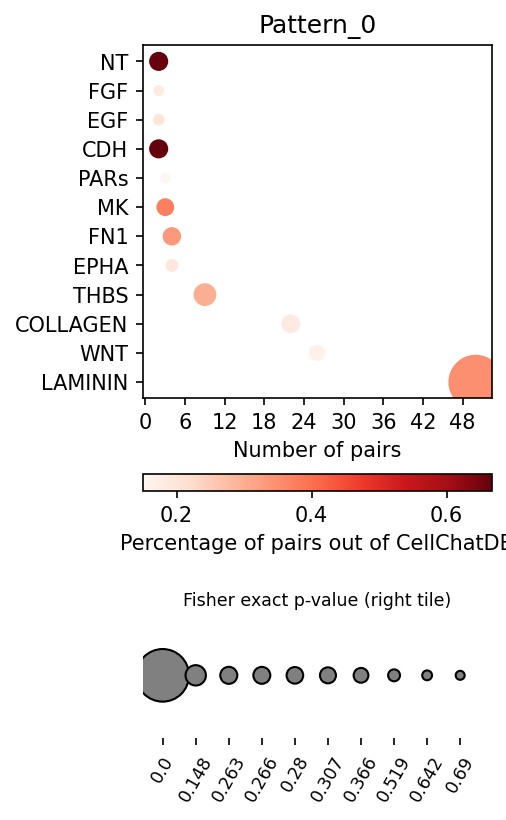

In [73]:
# figsize=(7,20) for num_cutoff=1, p_cutoff=None, 
Pattern = 'Pattern_0'
fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,6))   

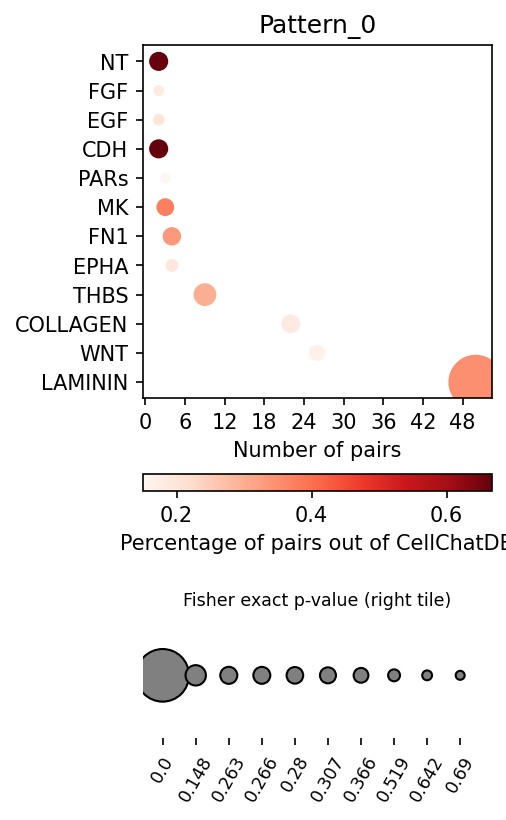

In [74]:
# fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,6),
#              pdf=f"{path}/FineST/FineST_local/Dataset/NPC/CropROI/mel_DE_enrichment_{Pattern}_ROI1") 

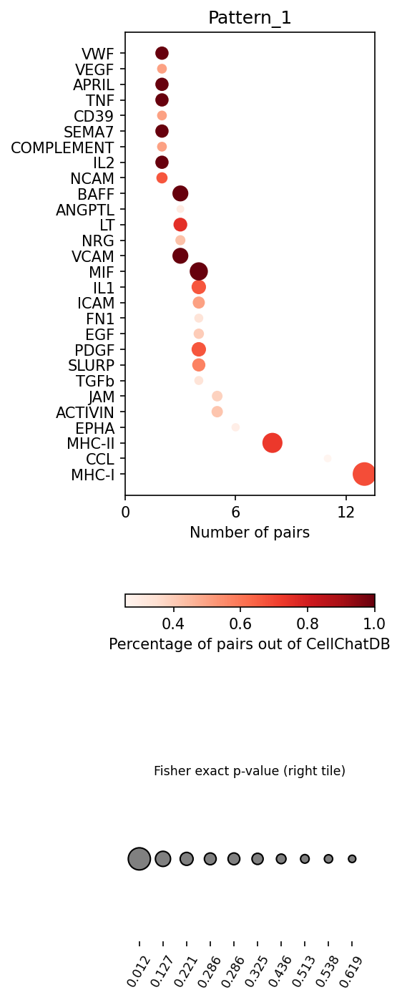

In [77]:
Pattern = 'Pattern_1'
fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,11))   

In [79]:
# fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,11),
#                pdf=f"{path}/FineST/FineST_local/Dataset/NPC/CropROI/mel_DE_enrichment_{Pattern}_ROI1")  

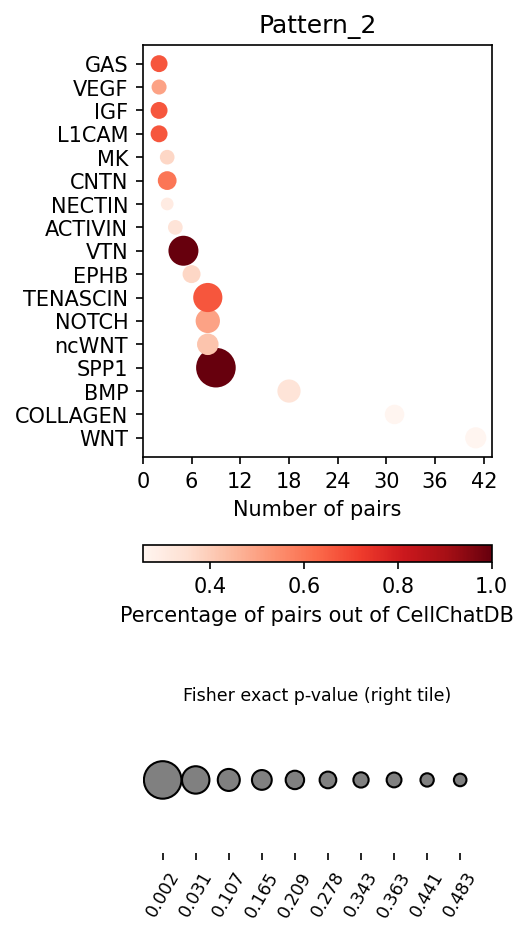

In [83]:
Pattern = 'Pattern_2'
fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,7))   

In [85]:
# fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,7),
#                 pdf=f"{path}/FineST/FineST_local/Dataset/NPC/CropROI/mel_DE_enrichment_{Pattern}_ROI1")  

In [86]:
## chord diagrams to visualize the aggregated cell types (or interactions)
adata_impt_sc.obsm['celltypes'] = adata_impt_sc.obsm['TransImp_ct_pred']
pl.chord_celltype(adata_impt_sc, pairs=['MIF_ACKR3'], ncol=1, min_quantile=0.01)

GridPlot(id='p1165', ...)

## 2. Bounary image from NPC Visium dataset

**2.1 Crop image with correspondng adata**

The 10x Visium dataset (NPC_patient_1) from [Gong, et al](https://www.nature.com/articles/s41467-023-37614-6) can be downloaded from NPC1 in [Goole Drive](https://drive.google.com/drive/folders/1XQiRCyZv_xFrjjHMc3TrQ-R_srSwnGLE?dmr=1&ec=wgc-drive-globalnav-goto), where `ROI1.csv` is another ROI in paper.

**Input** \
    - `roi_path`: the pathway of the selected region using `napari` package. \
    - `img_path`: the original `.tif` HE image with high-resolution, it is about `800 MB` here. \
    - `adata_path`: the `.h5ad` adata corresponding to the HE image, from 10x Visium dataset. 
    
**Output** \
    - `crop_img_path`: the cropped image, saved in `.tif` format. \
    - `crop_adata_path`: the saved ST data, selected the `.obsm['spatial']` matched cropped image.

In [13]:
os.chdir(str(path))
roi_path = './FineST/FineST_local/Dataset/NPC/CropROI/Annodata/Boundary1.csv'
img_path = './NPC/Data/stdata/GSE200310_RAW/patient1/20210809-C-AH4199551.tif'
adata_path = './FineST/FineST_local/Dataset/NPC/TransImp/patient1_nuclei_anno_TransImp_NPC1_sc.h5ad'
crop_img_path = './FineST/FineST_local/Dataset/NPC/CropRec/NPC1_cropped_ROI_image.tif'
crop_adata_path = './FineST/FineST_local/Dataset/NPC/CropRec/NPC1_sc_ROI.h5ad'

In [14]:
cropped_img, adata_roi = fst.crop_img_adata(roi_path, 
                                            img_path, adata_path, 
                                            crop_img_path, crop_adata_path, 
                                            segment=False, save=True)

ROI coordinates from napari package: 
    index shape-type  vertex-index        axis-0       axis-1
0      3    polygon             0   6640.434693  7203.335263
1      3    polygon             1  10347.593830  5767.797045
2      3    polygon             2  10994.374780  6635.430034
3      3    polygon             3   6750.860710  7629.264185
img shape: 
 (17351, 17319, 3)
polygon: 
 [[ 6640.434693  7203.335263]
 [10347.59383   5767.797045]
 [10994.37478   6635.430034]
 [ 6750.86071   7629.264185]]
polygon adjusted: 
 [[ 6640.434693  7203.335263]
 [10347.59383   5767.797045]
 [10994.37478   6635.430034]
 [ 6750.86071   7629.264185]]
cropped_img shape: 
 (4354, 1861, 3)
The adata: 
 AnnData object with n_obs × n_vars = 40068 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
The range of original adata: 
 [[1791, 13306], [1357, 11398]]


Show image shape and adata property

In [15]:
print(cropped_img.shape)
print(adata_roi)

(4354, 1861, 3)
AnnData object with n_obs × n_vars = 2672 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'


See the range of the spatial coordinats of the 1st colnum and 2nd colnum in `adata.obsm['spatial']`

In [16]:
print(adata_roi.obsm["spatial"][:,0].min(), adata_roi.obsm["spatial"][:,0].max())
print(adata_roi.obsm["spatial"][:,1].min(), adata_roi.obsm["spatial"][:,1].max())

5784 7612
6680 10971


Plot the crooped ROI region in original HE image with high-resolution

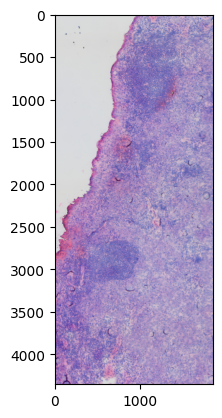

In [17]:
plt.imshow(cropped_img)
plt.show()

See the gene expression saved in `adata.X`, only contains the samples that belongs to the cropped ROI image

In [18]:
adata_roi.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,KDR,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR
8041,0.302604,0.109524,0.148009,0.053230,0.064085,0.181022,0.002292,0.075156,0.067228,0.136538,...,0.003583,0.067403,0.004730,0.003778,0.179127,0.108147,0.004352,0.106178,0.435501,0.483437
8049,0.318536,0.118025,0.124202,0.035704,0.119441,0.122999,0.003493,0.066417,0.065475,0.102506,...,0.012929,0.065112,0.004817,0.004524,0.182994,0.102539,0.004472,0.157304,0.417952,0.439255
8097,0.273096,0.076893,0.136564,0.025154,0.089150,0.104589,0.003453,0.035427,0.085269,0.076331,...,0.004822,0.075949,0.012939,0.004475,0.145200,0.113573,0.004415,0.138573,0.393523,0.390203
8207,0.311711,0.102568,0.166698,0.004814,0.093933,0.080958,0.004147,0.027886,0.154552,0.066274,...,0.004888,0.102577,0.017543,0.004252,0.175728,0.141577,0.004340,0.173253,0.454644,0.425937
8282,0.383476,0.095612,0.203807,0.063937,0.091198,0.169869,0.002620,0.094756,0.120204,0.164543,...,0.004221,0.146890,0.004259,0.004619,0.166209,0.159947,0.004756,0.109616,0.377819,0.553325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24271,0.662846,0.514540,0.032835,0.040933,0.075112,0.115587,0.003582,0.064994,0.004516,0.068413,...,0.004908,0.004416,0.025440,0.004530,0.550846,0.024451,0.004471,0.932140,1.604519,1.041233
24329,0.624141,0.499691,0.035832,0.004959,0.085457,0.086626,0.004089,0.077279,0.004925,0.060645,...,0.006636,0.004956,0.030244,0.004753,0.527468,0.018320,0.004683,0.967321,1.613216,1.025589
24366,0.625403,0.489985,0.033611,0.021726,0.086315,0.113832,0.003293,0.064736,0.033775,0.068268,...,0.004914,0.004631,0.027921,0.004390,0.525987,0.019299,0.004469,0.964156,1.655212,1.034990
24389,0.678020,0.522608,0.040336,0.004818,0.114615,0.102922,0.004322,0.076132,0.039875,0.071850,...,0.005973,0.004393,0.034565,0.004430,0.575876,0.025741,0.004205,0.978740,1.691294,1.036511


The NPC1 adata `visium_nuclei_annotated_TransImp_NPC1.h5ad` is obtained from nuclei-segmentaion and cell type annotation, so we can show the cells within this ROI. For others ones can only show the gene expression situation.

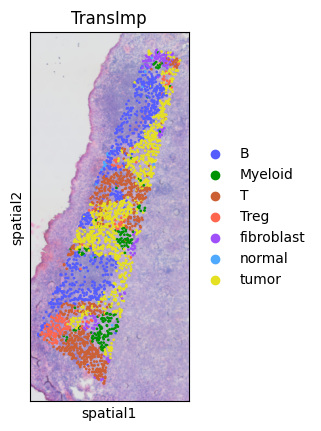

In [21]:
import matplotlib.pyplot as plt
ctype_hex_map = {'B': '#565DFD',
 'normal': '#4fa9ff',
 'Treg': '#FE664D',
 'fibroblast': '#9f50f9',
 'Myeloid': '#009203',
 'tumor': '#e5e022',
 'T': '#CB6035'}

fig, ax = plt.subplots(1, 1, dpi=100)
sc.pl.spatial(adata_roi, img_key='hires', color="cell_type", title='TransImp', 
              size=0.25, alpha_img=0.8, palette=ctype_hex_map, ax=ax)  

In [23]:
os.chdir(f"{path}/FineST/FineST_local/Dataset/NPC/CropRec/")
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/NPC/CropRec


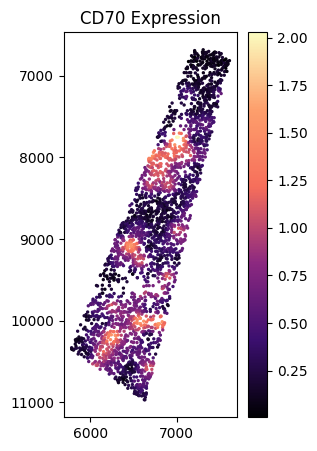

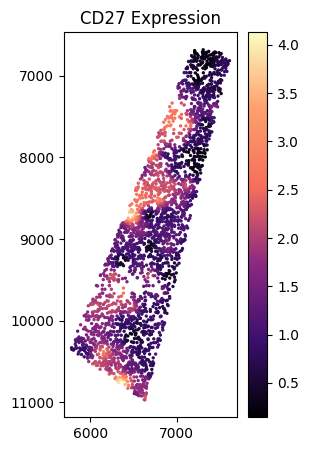

In [25]:
fstplt.gene_expr(adata_roi, adata_roi.to_df(), gene_selet='CD70', marker='o', 
                 s=2, figsize=(2.8, 5), save_path='CD70_expr_Bond1.pdf')
fstplt.gene_expr(adata_roi, adata_roi.to_df(), gene_selet='CD27', marker='o',
                 s=2, figsize=(2.8, 5), save_path='CD27_expr_Bond1.pdf')

**2.2 CCC analysis**

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
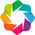

SpatailDM version: 0.2.0


In [26]:
import spatialdm as sdm
import spatialdm.plottings as pl
import matplotlib.pyplot as plt
print("SpatailDM version: %s" %sdm.__version__)

In [27]:
adata_impt_sc = adata_roi

In [28]:
visium_scale_factors = fst.json_load(f"{path}/FineST/FineST_local/Dataset/NPC/patient1/")
print(visium_scale_factors['spot_diameter_fullres'])

139.44595843130838


In [29]:
# spot_diameter_fullres = visium_scale_factors["spot_diameter_fullres"]
spot_diameter_fullres = 112
fst.weight_matrix(adata_impt_sc, l = spot_diameter_fullres, 
                  cutoff = 0.001, single_cell = True, n_nearest_neighbors=6)

AnnData object with n_obs × n_vars = 2672 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'

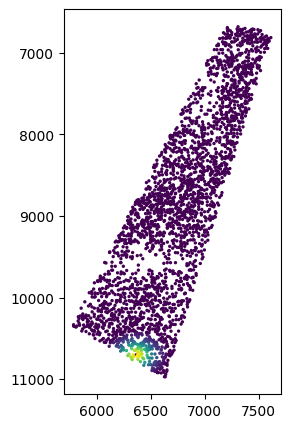

In [33]:
## Visualize the range of interaction
plt.figure(figsize=(2.8, 5))
plt.scatter(adata_impt_sc.obsm['spatial'][:,0], adata_impt_sc.obsm['spatial'][:,1],
            c=adata_impt_sc.obsp['weight'].A[500], s=2.0)
plt.gca().invert_yaxis()  
plt.tick_params(axis='both', which='both', bottom=True, left=True, labelbottom=True)

In [34]:
## find overlapping LRs from CellChatDB
start = time.time()
sdm.extract_lr(adata_impt_sc, 'human', min_cell=3)    
print("%.3f seconds" %(time.time()-start))
print(adata_impt_sc)

23.248 seconds
AnnData object with n_obs × n_vars = 2672 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell', 'mean', 'ligand', 'receptor', 'num_pairs', 'geneInter'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'


In [35]:
## see the condidiate LR pairs for this NPC datset 
adata_impt_sc.uns['geneInter']

,interaction_name,pathway_name,agonist,antagonist,co_A_receptor,co_I_receptor,evidence,annotation,interaction_name_2
EFNA5_EPHB2,EFNA5_EPHB2,EPHA,NaN,NaN,NaN,NaN,PMID:15107857; PMID: 15114347,Cell-Cell Contact,EFNA5 - EPHB2
EFNB1_EPHA4,EFNB1_EPHA4,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHA4
EFNB1_EPHB1,EFNB1_EPHB1,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHB1
EFNB1_EPHB2,EFNB1_EPHB2,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHB2
EFNB1_EPHB3,EFNB1_EPHB3,EPHB,NaN,NaN,NaN,NaN,PMID: 15114347,Cell-Cell Contact,EFNB1 - EPHB3
...,...,...,...,...,...,...,...,...,...
CCL3_CCR5,CCL3_CCR5,CCL,NaN,NaN,NaN,NaN,KEGG: hsa04060,Secreted Signaling,CCL3 - CCR5
CCL5_CCR5,CCL5_CCR5,CCL,NaN,NaN,NaN,NaN,KEGG: hsa04060,Secreted Signaling,CCL5 - CCR5
CCL4_CCR5,CCL4_CCR5,CCL,NaN,NaN,NaN,NaN,KEGG: hsa04060,Secreted Signaling,CCL4 - CCR5
CXCL1_ACKR1,CXCL1_ACKR1,CXCL,NaN,NaN,NaN,NaN,PMID: 26740381,Secreted Signaling,CXCL1 - ACKR1


In [36]:
## Identify dataset-specific interacting LR pairs (global selection)
start = time.time()

# global Moran selection
sdm.spatialdm_global(adata_impt_sc, n_perm=1000, specified_ind=None, method='z-score', nproc=1)  
# select significant pairs
sdm.sig_pairs(adata_impt_sc, method='z-score', fdr=True, threshold=0.05)  

print("%.3f seconds" %(time.time()-start))
print(adata_impt_sc)

3.310 seconds
AnnData object with n_obs × n_vars = 2672 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell', 'mean', 'ligand', 'receptor', 'num_pairs', 'geneInter', 'global_I', 'global_stat', 'global_res'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'


In [37]:
spa_coexp_pair_sc = fst.anno_LRpair(adata_impt_sc)
spa_coexp_pair_sc

,Ligand0,Ligand1,Receptor0,Receptor1,Receptor2,z_pval,z,fdr,selected,evidence,annotation
SEMA3B_NRP1_PLXNA1,SEMA3B,None,NRP1,PLXNA1,None,0.000000,43.233954,0.0,True,PMID: 27533782,Secreted Signaling
WNT5B_FZD1,WNT5B,None,FZD1,None,None,0.000000,50.186704,0.0,True,KEGG: hsa04310,Secreted Signaling
WNT5B_FZD4,WNT5B,None,FZD4,None,None,0.000000,78.985347,0.0,True,KEGG: hsa04310,Secreted Signaling
WNT5B_FZD5,WNT5B,None,FZD5,None,None,0.000000,160.524778,0.0,True,KEGG: hsa04310,Secreted Signaling
WNT5B_FZD6,WNT5B,None,FZD6,None,None,0.000000,120.199832,0.0,True,KEGG: hsa04310,Secreted Signaling
...,...,...,...,...,...,...,...,...,...,...,...
WNT2_FZD7_LRP6,WNT2,None,FZD7,LRP6,None,1.000000,-22.204888,1.0,False,KEGG: hsa04310; PMID: 23209147,Secreted Signaling
WNT2_FZD5_LRP6,WNT2,None,FZD5,LRP6,None,1.000000,-28.739469,1.0,False,KEGG: hsa04310; PMID: 23209147,Secreted Signaling
WNT2_FZD4_LRP6,WNT2,None,FZD4,LRP6,None,1.000000,-33.850176,1.0,False,KEGG: hsa04310; PMID: 23209147,Secreted Signaling
WNT1_FZD5_LRP6,WNT1,None,FZD5,LRP6,None,0.955122,-1.696686,1.0,False,KEGG: hsa04310; PMID: 23209147,Secreted Signaling


In [38]:
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/NPC/CropRec


In [39]:
## see the unique gene of sig LR pairs
spa_coexp_pairTgene_sc = fst.LRpair_gene(spa_coexp_pair_sc)
print("spa_coexp_pairTgene_sc shape:", len(spa_coexp_pairTgene_sc))

spa_coexp_pairTgene_sc shape: 426


In [40]:
# # save 798 significant LR pairs
# spa_coexp_pair_sc.to_csv("spa_coexp_pair_sc_Bound1_singleT.csv", index=True, header=True)
# spa_coexp_pairTgene_sc.to_csv("spa_coexp_LRgene_sc_Bound1_singleT.csv", index=True, header=True)

In [41]:
## use fdr corrected global p-values and a threshold FDR < 0.1 (default)
print(adata_impt_sc.uns['global_res'].selected.sum())
adata_impt_sc.uns['global_res'].sort_values(by='fdr')  

677


,Ligand0,Ligand1,Receptor0,Receptor1,Receptor2,z_pval,z,fdr,selected
SEMA3B_NRP1_PLXNA1,SEMA3B,None,NRP1,PLXNA1,None,0.000000,43.233954,0.0,True
WNT5B_FZD1,WNT5B,None,FZD1,None,None,0.000000,50.186704,0.0,True
WNT5B_FZD4,WNT5B,None,FZD4,None,None,0.000000,78.985347,0.0,True
WNT5B_FZD5,WNT5B,None,FZD5,None,None,0.000000,160.524778,0.0,True
WNT5B_FZD6,WNT5B,None,FZD6,None,None,0.000000,120.199832,0.0,True
...,...,...,...,...,...,...,...,...,...
WNT2_FZD7_LRP6,WNT2,None,FZD7,LRP6,None,1.000000,-22.204888,1.0,False
WNT2_FZD5_LRP6,WNT2,None,FZD5,LRP6,None,1.000000,-28.739469,1.0,False
WNT2_FZD4_LRP6,WNT2,None,FZD4,LRP6,None,1.000000,-33.850176,1.0,False
WNT1_FZD5_LRP6,WNT1,None,FZD5,LRP6,None,0.955122,-1.696686,1.0,False


In [42]:
## Local selection is then run for the selected 787 pairs to identify where the LRI takes place
adata_impt_sc.raw = adata_impt_sc

start = time.time()

# local spot selection
sdm.spatialdm_local(adata_impt_sc, n_perm=1000, method='z-score', specified_ind=None, nproc=1) 
# significant local spots
sdm.sig_spots(adata_impt_sc, method='z-score', fdr=False, threshold=0.05)  

print("%.3f seconds" %(time.time()-start))

2.617 seconds


In [43]:
print(adata_impt_sc)

AnnData object with n_obs × n_vars = 2672 × 596
    obs: 'x', 'y', 'cell_type'
    uns: 'spatial', 'cell_type_colors', 'single_cell', 'mean', 'ligand', 'receptor', 'num_pairs', 'geneInter', 'global_I', 'global_stat', 'global_res', 'local_stat', 'local_z', 'local_z_p', 'selected_spots'
    obsm: 'TransImp_ct_pred', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'weight', 'nearest_neighbors'


In [44]:
adata_impt_sc.uns["local_z_p"]

,8041,8049,8097,8207,8282,8354,8374,8419,8434,8469,...,24138,24144,24148,24191,24267,24271,24329,24366,24389,24548
EFNB1_EPHA4,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,0.752921,0.508404,0.825745,0.926070,0.529031,0.878696,0.875564,0.892854,0.859717,0.846208
EFNB1_EPHB2,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,0.937062,0.846200,0.902077,0.962316,0.855496,0.954743,0.923138,0.934162,0.942227,0.902452
EFNB1_EPHB4,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,0.303911,0.352038,0.314697,0.055870,0.553391,0.132192,0.206513,0.158968,0.183553,0.207745
EFNB2_EPHB1,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,0.832148,0.989964,0.694063,1.000000,0.954220,0.519933,0.572628,0.543469,0.548614,0.692403
EFNB2_EPHB2,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCL20_CCR6,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCL5_CCR5,1.000000e+00,1.000000e+00,1.000000e+00,9.998560e-01,7.208948e-01,9.359357e-01,1.000000e+00,1.000000e+00,2.461541e-02,5.322498e-12,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCL4_CCR5,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CXCL1_ACKR1,4.645221e-12,9.530826e-08,5.085867e-08,1.567185e-32,5.384154e-26,2.910531e-164,6.792969e-178,1.611468e-226,5.801459e-155,1.269356e-81,...,0.963522,1.000000,0.965090,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [45]:
fst.topLRpairs(adata_impt_sc, spa_coexp_pair_sc, num=10)

['NCAM1_NCAM1',
 'CADM1_CADM1',
 'ESAM_ESAM',
 'JAM2_JAM2',
 'F11R_F11R',
 'PECAM1_PECAM1',
 'CDH2_CDH2',
 'MPZL1_MPZL1',
 'CD99_CD99',
 'CDH1_CDH1']

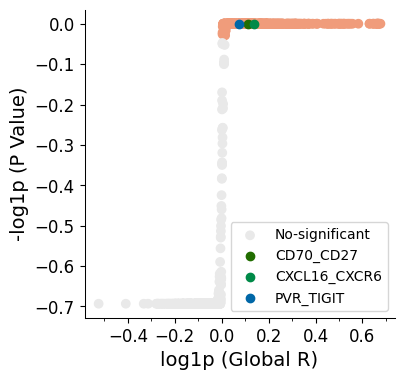

In [50]:
fstplt.global_plot(adata_impt_sc, pairs=['CD70_CD27', 'CXCL16_CXCR6', 'PVR_TIGIT'],
               figsize=(4.0, 4.0), loc=4, cmap='RdGy_r', vmin=-1.5, vmax=2,  max_step=0.2, min_step=0.1)
plt.savefig('NPC1_3pair_sc_Bound1_singleT.svg', transparent=True, dpi=300, bbox_inches='tight')

['PVR_TIGIT', 'CD70_CD27', 'CXCL16_CXCR6']


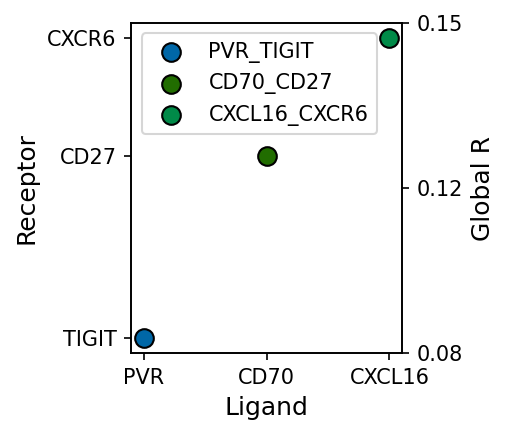

In [72]:
# Example usage
pairs=['CD70_CD27', 'CXCL16_CXCR6', 'PVR_TIGIT']
fst.LR_global_moranR(adata_impt_sc, pairs, fig_size=(3.5, 3), font_size=12,
                 # save_path=None)
                save_path='LRpair_sele_globalR_bond1.svg')

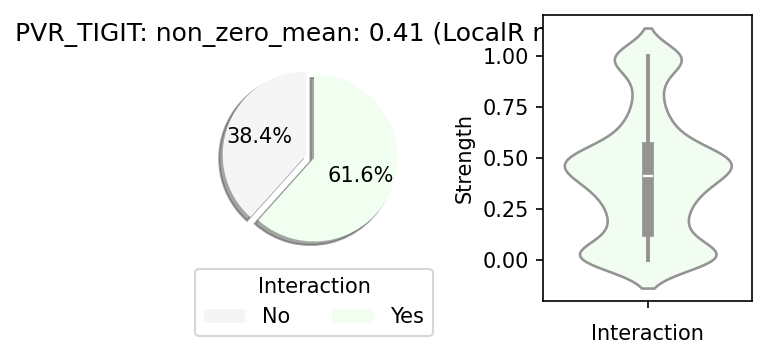

In [76]:
# Example usage
# pair = 'CD70_CD27'
# pair='CXCL16_CXCR6'
pair='PVR_TIGIT'
fstplt.LR_local_moranR(adata_impt_sc, pair, fig_size=(4, 2.5), 
            # save_path=None)
            save_path=f'{pair}_interaction.svg')

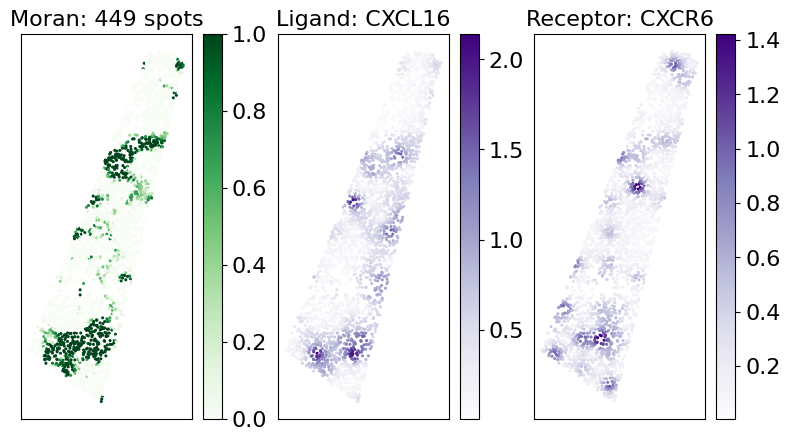

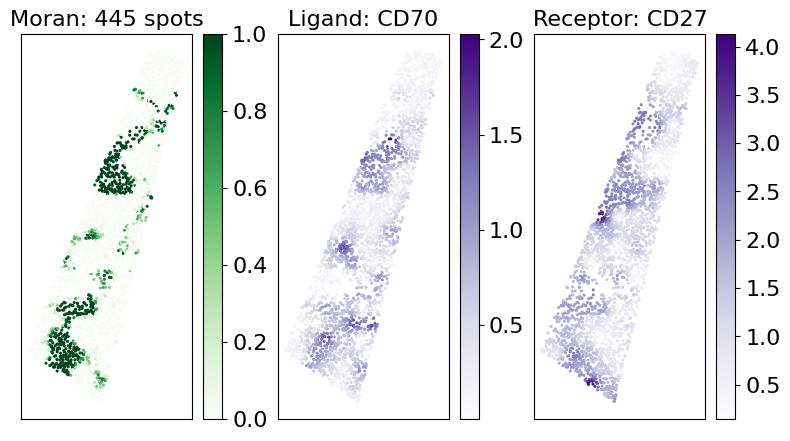

In [66]:
fstplt.plot_pairs_dot(adata_impt_sc, ['CXCL16_CXCR6'], trans=True, figsize=(16, 5), 
                      marker_size=1.5, pdf="NPC1_sc_pair_Bond1_CXCL16_CXCR6")
fstplt.plot_pairs_dot(adata_impt_sc, ['CD70_CD27'], trans=True, figsize=(16, 5), 
                      marker_size=1.5, pdf="NPC1_sc_pair_Bond1_CD70_CD27")

In [77]:
# bin_spots = (1-adata_impt_sc.uns["local_z_p"])[adata_impt_sc.uns['local_stat']['n_spots']>2]
bin_spots = adata_impt_sc.uns['selected_spots'].astype(int)[adata_impt_sc.uns['local_stat']['n_spots']>2]
print(bin_spots.shape[0], " pairs used for spatial clustering")
bin_spots=bin_spots.fillna(0)
bin_spots

677  pairs used for spatial clustering


,8041,8049,8097,8207,8282,8354,8374,8419,8434,8469,...,24138,24144,24148,24191,24267,24271,24329,24366,24389,24548
EFNB1_EPHA4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EFNB1_EPHB2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EFNB1_EPHB4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EFNB2_EPHB1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EFNB2_EPHB2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCL20_CCR6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CCL5_CCR5,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
CCL4_CCR5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CXCL1_ACKR1,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [78]:
from threadpoolctl import threadpool_limits
import NaiveDE
import SpatialDE

with threadpool_limits(limits=1, user_api='blas'):
    start = time.time()
    results = SpatialDE.run(adata_impt_sc.obsm['spatial'], bin_spots.transpose())
    print("--- %.3f seconds ---" %(time.time()-start))

    start = time.time()
    histology_results, patterns = SpatialDE.aeh.spatial_patterns(
        adata_impt_sc.obsm['spatial'], bin_spots.transpose(), results, C=3, l=3, verbosity=1)
    print("--- %.3f seconds ---" %(time.time()-start))

INFO:root:Performing DE test
INFO:root:Pre-calculating USU^T = K's ...
INFO:root:Done: 3.2e+01s
INFO:root:Fitting gene models
Models: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:29<00:00,  2.96s/it]
INFO:root:Finished fitting 10 models to 677 genes


--- 62.522 seconds ---
iter 0, ELBO: -3.67e+08
iter 1, ELBO: -1.53e+08, delta_ELBO: 2.14e+08
iter 2, ELBO: -1.53e+08, delta_ELBO: 2.68e+05
iter 3, ELBO: -1.53e+08, delta_ELBO: 6.05e+03
iter 4, ELBO: -1.53e+08, delta_ELBO: 4.78e+04
iter 5, ELBO: -1.53e+08, delta_ELBO: 2.73e+03
iter 6, ELBO: -1.53e+08, delta_ELBO: 4.59e+02
iter 7, ELBO: -1.53e+08, delta_ELBO: 1.56e+02
iter 8, ELBO: -1.53e+08, delta_ELBO: 5.98e+01
iter 9, ELBO: -1.53e+08, delta_ELBO: 1.35e+01
iter 10, ELBO: -1.53e+08, delta_ELBO: 7.42e+00
iter 11, ELBO: -1.53e+08, delta_ELBO: 5.93e+00
iter 12, ELBO: -1.53e+08, delta_ELBO: 1.28e+01
iter 13, ELBO: -1.53e+08, delta_ELBO: 2.24e+00
iter 14, ELBO: -1.53e+08, delta_ELBO: 5.41e-02
iter 15, ELBO: -1.53e+08, delta_ELBO: 1.79e-01
iter 16, ELBO: -1.53e+08, delta_ELBO: 4.42e+00
iter 17, ELBO: -1.53e+08, delta_ELBO: 5.51e-01
iter 18, ELBO: -1.53e+08, delta_ELBO: 1.45e+00
iter 19, ELBO: -1.53e+08, delta_ELBO: 5.29e+00
iter 20, ELBO: -1.53e+08, delta_ELBO: 4.71e+00
iter 21, ELBO: -1.53e+

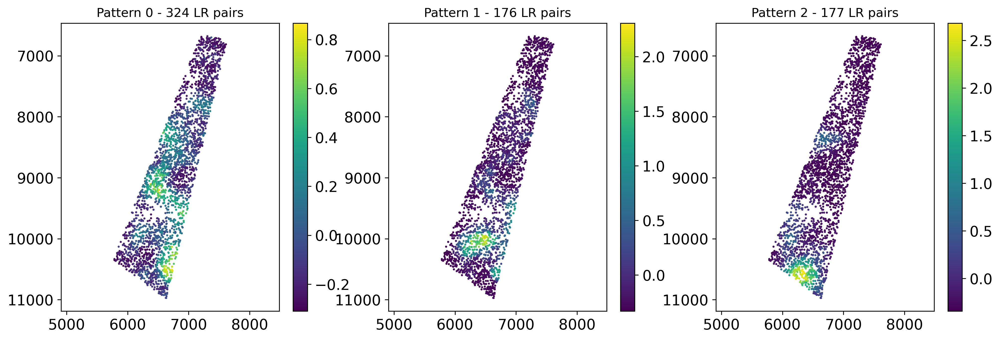

In [87]:
fst.spatialDE_clusters(histology_results, patterns, adata_impt_sc.obsm['spatial'], w=3, s=1, 
                       figsize=(16, 5), trans=True, format='svg', marker='o',
                       save_path='NPC1_mel_DE_clusters_singleT_boun1.svg')

In [143]:
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/NPC/CropRec


In [144]:
patientxy = 'patient1'
adata_save = fst.clean_save_adata(adata_impt_sc, str(patientxy)+'_adata_pattern_boundary.h5ad')

In [83]:
histology_results.to_csv('NPC1_histology_results_sc_Bound1.csv', index=False)
patterns.to_csv('NPC1_patterns_sc_Bound1.csv', index=False)

**2.3 L-R-TF-TG**

In [88]:
import os
import pandas as pd
os.chdir(str(path)+'FineST/FineST_local/Dataset/NPC/CropRec/')
histology_results = pd.read_csv('NPC1_histology_results_sc_Bound1.csv')
histology_results

,g,pattern,membership
0,EFNB1_EPHA4,0,1.0
1,EFNB1_EPHB2,0,1.0
2,EFNB1_EPHB4,0,1.0
3,EFNB2_EPHB1,0,1.0
4,EFNB2_EPHB2,0,1.0
...,...,...,...
672,CCL4_CCR5,2,1.0
673,CXCL1_ACKR1,2,1.0
674,CORT_SSTR2,1,1.0
675,HLA-G_CD8A,2,1.0


In [89]:
path = '/mnt/lingyu/nfs_share2/Python/'
os.chdir(str(path) + 'FineST/FineST/')

Receptor2TF = fst.extract_tf(species='human')
Receptor2TF

,receptor,pathway,tf,tf_PPR,category
0,PKM,Glycolysis / Gluconeogenesis,ENO1,0.042934,Metabolism
1,ALDOA,Glycolysis / Gluconeogenesis,ENO1,0.009696,Metabolism
2,GPI,Glycolysis / Gluconeogenesis,ENO1,0.000961,Metabolism
3,MINPP1,Glycolysis / Gluconeogenesis,ENO1,0.066090,Metabolism
4,NPR2,Purine metabolism,NME2,0.022436,Metabolism
...,...,...,...,...,...
93601,"PLXNA1,TREM2,TYROBP",Nervous system development,PSMD9,0.000153,Developmental Biology
93602,"PLXNA1,TREM2,TYROBP",Nervous system development,SOS1,0.002213,Developmental Biology
93603,"PLXNA1,TREM2,TYROBP",Nervous system development,SOS2,0.000206,Developmental Biology
93604,"PLXNA1,TREM2,TYROBP",Nervous system development,SRC,0.009406,Developmental Biology


In [90]:
RegNetwork = pd.read_csv(str(path)+'FineST/FineST/FineST/datasets/RegNetwork/Regnetwork_hum.csv')
RegNetwork.columns = ['tf', 'target']
RegNetwork

,tf,target
0,ZBTB33,WASH8P
1,ZBTB33,CHAF1A
2,ZBTB33,MTRNR2L1
3,ZBTB33,MTRNR2L2
4,ZBTB33,MTRNR2L8
...,...,...
192067,ZNF76,CDKN1A
192068,ZNF76,PCYT1A
192069,ZNF76,TALDO1
192070,ZNRD1,ABCB1


In [91]:
os.chdir(str(path)+'FineST/FineST_local/Dataset/NPC/CropRec/')
!pwd

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/NPC/CropRec


In [92]:
tmp = fst.pattern_LR2TF2TG(histology_results, pattern_num=0, R_TFdatabase=Receptor2TF, TF_TGdatabase=RegNetwork)
tmp

This pattern contain %s unique ligand 126
This pattern contain %s unique receptor 141
This pattern contain %s unique tf 325


,Ligand,Receptor,tf,Target,value
0,ICAM5,CD209,CEBPB,LOC100270746,0.009272
1,ICAM5,CD209,CEBPB,MIR3187,0.009272
2,ICAM5,CD209,CEBPB,MTRNR2L4,0.009272
3,ICAM5,CD209,CEBPB,ABCF2,0.009272
4,ICAM5,CD209,CEBPB,HIPK3,0.009272
...,...,...,...,...,...
20728743,CSF3,IFNGR2,ZNF382,STAT3,0.026704
20728744,TNFSF11,IFNGR1,ZNF382,STAT5B,0.026704
20728745,CSF3,IFNGR2,ZNF382,STAT5B,0.026704
20728746,TNFSF11,IFNGR1,ZNF383,JUN,0.026704


In [93]:
## order according to 'value'
tmp = tmp.sort_values(by="value", ascending=False)
## statistic value classes
num_classes = tmp['value'].nunique()
print('Number of unique classes: ', num_classes)

Number of unique classes:  1933


In [94]:
selected_rows = []
num_sele = 1
for value, group in tmp.groupby('value'):
    selected_rows.append(group.head(num_sele))
    
tmp_sele = pd.concat(selected_rows)
tmp_sele = tmp_sele.sort_values(by="value", ascending=False)
print('Length of tmp_sele:\n', len(tmp_sele))
print(tmp_sele)

Length of tmp_sele:
 1933
          Ligand Receptor      tf  Target     value
18319836    WNT6   TGFBR2   SMAD2  SMURF2  0.459459
20630485    BMP6   TGFBR1   SMAD3    GLI2  0.459459
16418870    BMP6   TGFBR1   SMAD4  HMG20A  0.390541
16444316    WNT6   TGFBR2   SMAD4  SPTBN1  0.390541
20243197  LRRC4B    PTPRF  CTNNB1     MYC  0.285677
...          ...      ...     ...     ...       ...
20726959   L1CAM    L1CAM    UPF2    UPF1  0.000001
20727000  COL9A2    NRCAM    UPF2    UPF1  0.000001
19865569  COL9A2    NRCAM    ABL1    CD55  0.000001
20726974  COL4A2    ITGA9    UPF2    UPF1  0.000001
20726973  COL9A3    ITGB1    UPF2    UPF1  0.000001

[1933 rows x 5 columns]


In [95]:
num_top = 20
tmp_sele_top = tmp_sele[:num_top]
tmp_sele_top

,Ligand,Receptor,tf,Target,value
18319836,WNT6,TGFBR2,SMAD2,SMURF2,0.459459
20630485,BMP6,TGFBR1,SMAD3,GLI2,0.459459
16418870,BMP6,TGFBR1,SMAD4,HMG20A,0.390541
16444316,WNT6,TGFBR2,SMAD4,SPTBN1,0.390541
20243197,LRRC4B,PTPRF,CTNNB1,MYC,0.285677
18338258,JAG2,NOTCH3,RBPJ,CTBP2,0.283606
20521804,PTN,IL1R1,NFKB1,PTGER4,0.247764
19640905,CDH1,CDH1,CTNNB1,MAGI2,0.230145
15040153,IL1A,IL6ST,STAT3,ISPD-AS1,0.228232
16540412,BMP6,ACVR2B,SMAD3,STUB1,0.221048


In [105]:
ligand_list = set(tmp_sele_top['Ligand'])
receptor_list = set(tmp_sele_top['Receptor'])

In [131]:
## select some inmortant ligands and receptors
# ligand_list = {'MIF', 'CXCL16', 'PVR',  'CD70', 'EFNA5', 'ICAM2', 'EFNA5', 'LCK', 'GP1BA'}   # 'L1CAM', 'JAM3', 'JAM2', 
# receptor_list = {'ACKR3', 'CXCR6', 'TIGIT', 'CD27', 'CD8B1', 'EPHA3', 'ITGAL', 'ITGB2', 'JAM2', 'EPHA3', 'ITGA4', 'CD8A', 'ITGAM'}
subdf = fst.top_pattern_LR2TF(tmp_sele_top, ligand_list, receptor_list, top_num=15)
subdf

Ligand and Receptor in R2TFdatabase: 20


,Ligand_symbol,Receptor_symbol,TF,Target,value
18319836,WNT6,TGFBR2,SMAD2,SMURF2,0.459459
20630485,BMP6,TGFBR1,SMAD3,GLI2,0.459459
16418870,BMP6,TGFBR1,SMAD4,HMG20A,0.390541
16444316,WNT6,TGFBR2,SMAD4,SPTBN1,0.390541
20243197,LRRC4B,PTPRF,CTNNB1,MYC,0.285677
18338258,JAG2,NOTCH3,RBPJ,CTBP2,0.283606
20521804,PTN,IL1R1,NFKB1,PTGER4,0.247764
19640905,CDH1,CDH1,CTNNB1,MAGI2,0.230145
15040153,IL1A,IL6ST,STAT3,ISPD-AS1,0.228232
16540412,BMP6,ACVR2B,SMAD3,STUB1,0.221048


In [139]:
fstplt.sankey_LR2TF2TG(subdf, width=600, height=600, title='Pattern 0',  alpha_color=0.6)

In [140]:
fstplt.sankey_LR2TF2TG(subdf, width=600, height=600, title='Pattern 0',  alpha_color=0.6,
                    save_path='LRTR_Bond1_pattern0.svg', fig_format='svg')

**2.4 Pathway enrichment**

In [141]:
dic=dict()
for i in histology_results.sort_values('pattern').pattern.unique():
    dic['Pattern_{}'.format(i)]=histology_results.query('pattern == @i').sort_values('membership')['g'].values

In [142]:
## run code
(result,
 pathway_res,
 result_select,
 result_pattern_all) = fst.pathway_analysis(sample=adata_impt_sc,
                                            all_interactions=None,
                                            interaction_ls=None,
                                            name=None,
                                            groups=["Pattern_0"],
                                            cut_off=1,
                                            dic=dic)

In [145]:
print(result.shape)

(438, 5)


In [146]:
print(result_select.shape)
result_select.head()

(65, 5)


,fisher_p,pathway_size,selected,selected_inters,name
1,,,,,
WNT,5.722954e-10,160,80,"{WNT4_FZD1_LRP5, WNT6_FZD1_LRP6, WNT7B_FZD9_LR...",Pattern_0
COLLAGEN,8.989853e-01,120,29,"{COL4A2_ITGA11_ITGB1, COL9A3_ITGA9_ITGB1, COL9...",Pattern_0
BMP,1.507264e-03,54,26,"{BMP4_BMPR1B_BMPR2, BMP8A_ACVR1_ACVR2B, BMP7_B...",Pattern_0
SEMA3,6.907397e-04,39,21,"{SEMA3D_NRP1_PLXNA2, SEMA3B_NRP1_PLXNA2, SEMA3...",Pattern_0
LAMININ,9.999999e-01,143,17,"{LAMB3_DAG1, LAMB3_ITGA3_ITGB1, LAMA5_SV2C, LA...",Pattern_0


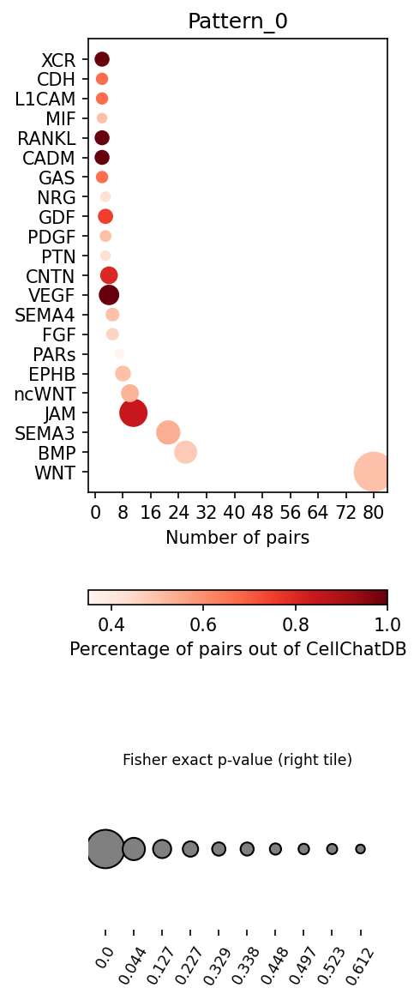

In [158]:
# figsize=(7,20) for num_cutoff=1, p_cutoff=None, 
Pattern = 'Pattern_0'
fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=8, figsize=(3,9))   

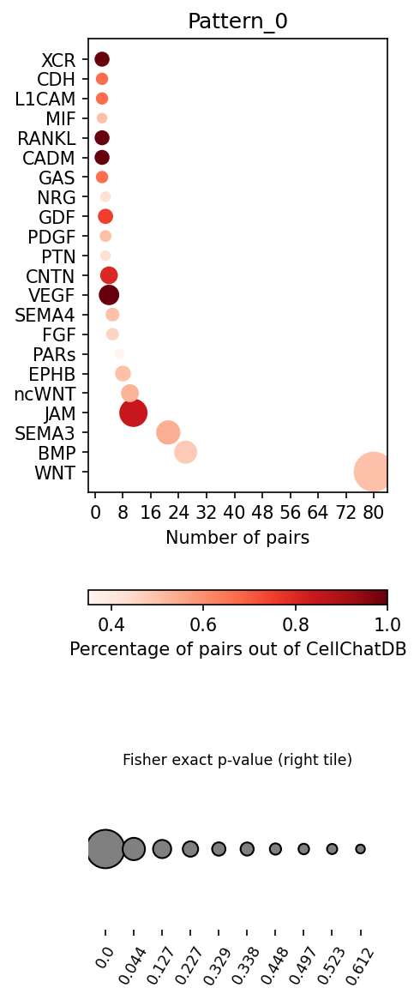

In [159]:
# fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=8, figsize=(3,9),
#              pdf=f'mel_DE_enrichment_{Pattern}_bound1') 

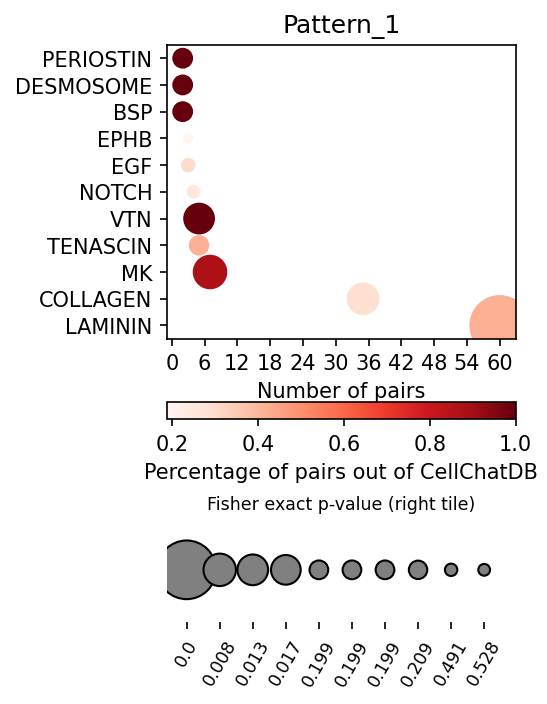

In [160]:
Pattern = 'Pattern_1'
fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,5))   

In [163]:
# fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=6, figsize=(3,5),
#                pdf=f"mel_DE_enrichment_{Pattern}_bound1")  

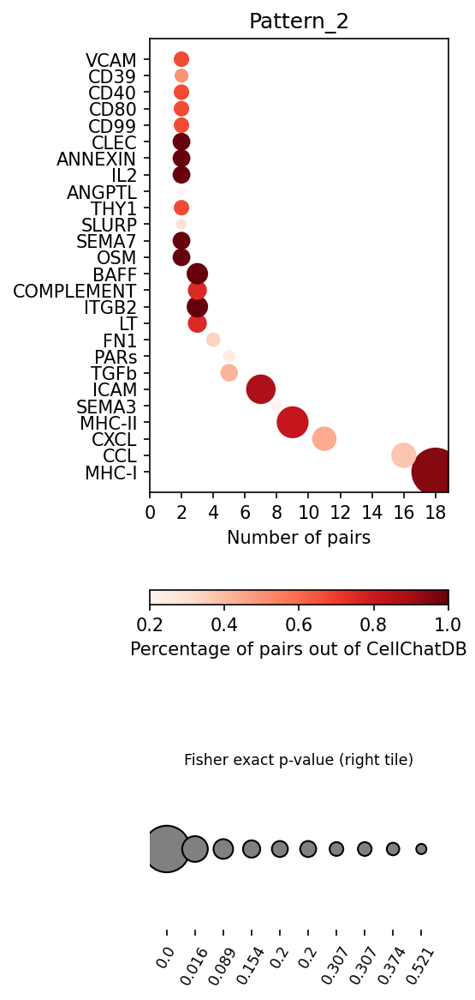

In [167]:
Pattern = 'Pattern_2'
fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=2, figsize=(3,9))   

In [169]:
# fstplt.dot_path(adata_impt_sc, dic=dic, num_cutoff=2, p_cutoff=0.5, groups=[str(Pattern)], step=2, figsize=(3,9),
#                 pdf=f"mel_DE_enrichment_{Pattern}_bound1")  

In [170]:
## chord diagrams to visualize the aggregated cell types (or interactions)
adata_impt_sc.obsm['celltypes'] = adata_impt_sc.obsm['TransImp_ct_pred']
pl.chord_celltype(adata_impt_sc, pairs=['CXCL16_CXCR6'], ncol=1, min_quantile=0.01)

GridPlot(id='p1165', ...)

In [172]:
## chord diagrams to visualize the aggregated cell types (or interactions)
adata_impt_sc.obsm['celltypes'] = adata_impt_sc.obsm['TransImp_ct_pred']
pl.chord_celltype(adata_impt_sc, pairs=['CD70_CD27'], ncol=1, min_quantile=0.01)

GridPlot(id='p2285', ...)

## 3. Corp ROI or WSI region from CRC Visium HD dataset

**3.1 Crop the whole slide imaging (WSI) with crosspoding adata**

The 10x Visium HD dataset (CRC 16um-binned) from [Oliveira, et al](https://www.biorxiv.org/content/10.1101/2024.06.04.597233v1) can be downloaded from CRC16um in [Goole Drive](https://drive.google.com/drive/folders/1XQiRCyZv_xFrjjHMc3TrQ-R_srSwnGLE?dmr=1&ec=wgc-drive-globalnav-goto). \
    - where `ROI4.csv` and `SelectedShapes.csv` are two coordinate files used in this notebook. \
    - `ROI1.csv`, `ROI2.csv` and `ROI3.csv` are other three ROIs in paper, \
    - `Rec1.csv`, `Rec2.csv` and `Rec3.csv` are rectangular regions inpaper. \
    - `Colon_Cancer_square_016um.h5ad` can be found at [figshare](https://figshare.com/articles/dataset/FineST_supplementary_data/26763241).

In [21]:
os.chdir(str(path))
roi_path = './VisiumHD/Dataset/Colon_Cancer/ResultsROIs/SelectedShapes.csv'
img_path = './VisiumHD/Dataset/Colon_Cancer/Visium_HD_Human_Colon_Cancer_tissue_image.btf'
adata_path = './VisiumHD/Dataset/Colon_Cancer_square_016um.h5ad'
crop_img_path = './FineST/FineST_local/Dataset/CRC16um/StarDist/DataOutput/cropped_ROI_image.tif'
crop_adata_path = './FineST/FineST_local/Dataset/CRC16um/StarDist/DataOutput/CRC_square_016um_ROI.h5ad'

In [22]:
cropped_img, adata_roi = fst.crop_img_adata(roi_path, 
                                            img_path, adata_path, 
                                            crop_img_path, crop_adata_path, save=True)

ROI coordinates from napari package: 
    index shape-type  vertex-index        axis-0        axis-1
0      0    polygon             0  22446.377777  40506.552504
1      0    polygon             1  22733.185336  65136.151680
2      0    polygon             2   -749.183601  65207.853570
3      0    polygon             3   -785.034546  40900.912899
img shape: 
 (48740, 75250, 3)
polygon: 
 [[22446.37777685 40506.55250441]
 [22733.18533639 65136.15168022]
 [ -749.18360124 65207.8535701 ]
 [ -785.03454618 40900.91289879]]
polygon adjusted: 
 [[22446.37777685 40506.55250441]
 [22733.18533639 65136.15168022]
 [    0.         65207.8535701 ]
 [    0.         40900.91289879]]
cropped_img shape: 
 (22734, 24701, 3)
The adata: 
 AnnData object with n_obs × n_vars = 137051 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
The range of original adata: 
 [[40624.27653892974, 65266.45052751989], [-1887.0913465

In [23]:
print(cropped_img.shape)
print(adata_roi)

(22734, 24701, 3)
AnnData object with n_obs × n_vars = 136922 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [24]:
print(adata_roi.obsm["spatial"][:,0].min(), adata_roi.obsm["spatial"][:,0].max())
print(adata_roi.obsm["spatial"][:,1].min(), adata_roi.obsm["spatial"][:,1].max())

40624.27653892974 65167.50360834386
0.4282210569424407 22680.620734693424


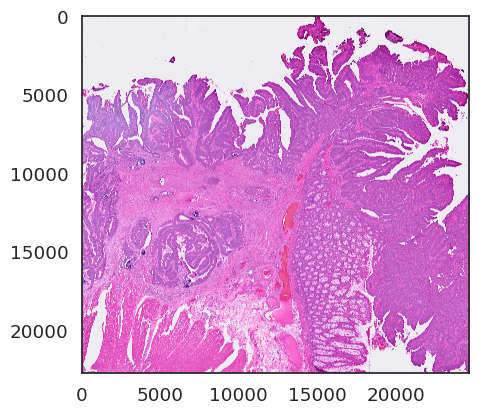

In [25]:
plt.imshow(cropped_img)
plt.show()

In [26]:
adata_roi.to_df()

,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,C1orf159,...,MT-ND2,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,MT-CYB
s_016um_00052_00082-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00010_00367-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,10.0,31.0,53.0,36.0,15.0,17.0,54.0,3.0,3.0,10.0
s_016um_00163_00399-1,0.0,0.0,0.0,0.0,0.0,1.0,8.0,2.0,0.0,0.0,...,0.0,1.0,2.0,1.0,2.0,1.0,5.0,0.0,1.0,1.0
s_016um_00238_00388-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.0,6.0,4.0,1.0,2.0,12.0,2.0,0.0,0.0
s_016um_00144_00175-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,2.0,1.0,1.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00375_00231-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,7.0,14.0,15.0,3.0,4.0,14.0,5.0,1.0,4.0
s_016um_00109_00223-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,2.0,5.0,2.0,1.0,0.0,1.0,0.0,0.0,3.0
s_016um_00039_00175-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0
s_016um_00037_00193-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


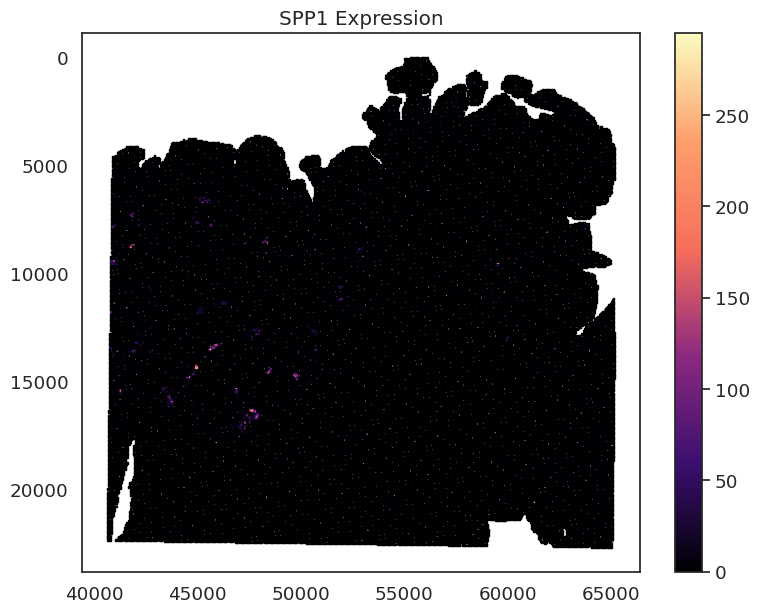

In [27]:
fstplt.gene_expr(adata_roi, adata_roi.to_df(), gene_selet='SPP1', marker='s', s=0.5, save_path=None)